#### Pose at least three questions related to business or real-world applications of how the data could be used:
    - What effect does date & time play in influencing daily electricity demand in NYC?
    - Can NYC Energy Demand be forecasted using a supervised learning regression approach?
    - Can NYC Weather Variables and Holidays be used as predictors to forecast energy demand?

Prepare data:
Gather necessary data to answer your questions
Handle categorical and missing data
Provide insight into the methods you chose and why you chose them
Analyze, Model, and Visualize
Provide a clear connection between your business questions and how the data answers them

In [2]:
import pandas as pd
import numpy as np
import os

In [3]:
df = pd.read_csv(os.path.join('data', 'nyc_energy_data.csv')).drop('Unnamed: 0', axis=1)

In [4]:
df.dtypes

timeStamp                  object
demand                    float64
lat                       float64
long                      float64
new_datetime               object
temperature               float64
precipTime                float64
precipDepth               float64
snowDepth                 float64
precipDepth/precipTime    float64
dtype: object

In [5]:
df['timeStamp'] = pd.to_datetime(df.timeStamp)
df['new_datetime'] = pd.to_datetime(df.new_datetime)

### We know that the data correponds to only one specific location; there is only one point location - (lat, long) pair

In [6]:
df.lat.value_counts()

40.701    49205
Name: lat, dtype: int64

In [7]:
df.long.value_counts() 


-74.009    49205
Name: long, dtype: int64

###  We will proceed wth dropping the lat and long columns

In [8]:
df.drop(['lat', 'long'], axis=1, inplace=True)

In [9]:
(df.timeStamp == df.new_datetime).sum() == len(df)

True

### Let's have a look at the distribution of each variable

In [10]:
import matplotlib.pyplot as plt

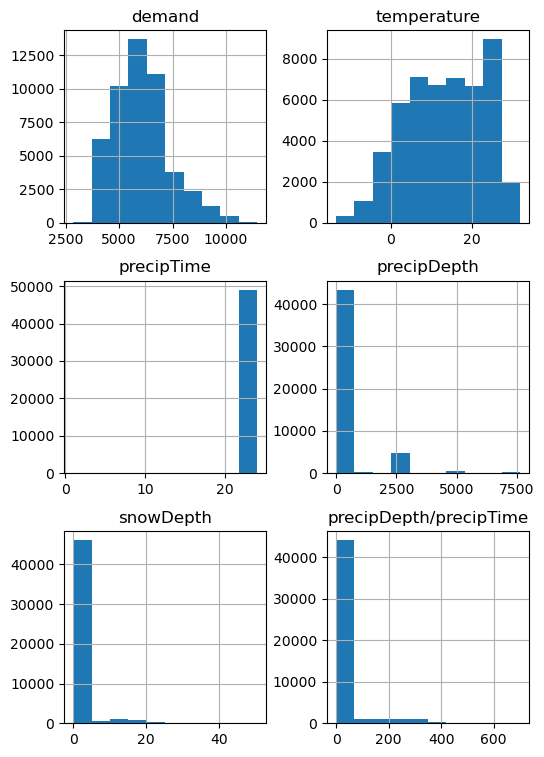

In [11]:
df.select_dtypes(include='number').hist(figsize=(6,9));

In [12]:
df.isnull().sum()

timeStamp                  0
demand                    81
new_datetime               0
temperature                0
precipTime                48
precipDepth               48
snowDepth                  0
precipDepth/precipTime    48
dtype: int64

In [13]:
def check_missing_records(df, datetime_col, freq):
    hold = pd.date_range(start=df.new_datetime.min(),end=df.new_datetime.max(),freq=freq)
    hold = pd.DataFrame(hold, columns=['datetime'])
    reconstituted_df = pd.merge(hold, df, how='left', left_on='datetime', right_on=datetime_col)
    missing_datetime_info = reconstituted_df.loc[reconstituted_df.new_datetime.isnull(), 'datetime']
    return reconstituted_df, missing_datetime_info

In [14]:
new_df, missing_rows_info = check_missing_records(df, 'new_datetime', 'H')

In [15]:
missing_rows_info

36794   2016-03-13 02:00:00
45530   2017-03-12 02:00:00
Name: datetime, dtype: datetime64[ns]

In [16]:
df = new_df

In [17]:
missing_dates = df[df.demand.isnull()].sort_values('datetime').timeStamp.dt.date.unique()

In [18]:
demand_ts = df.set_index('new_datetime').fillna(-99).demand

In [19]:
dem = demand_ts[demand_ts==-99]
dem.groupby(dem.index.date).count()

2012-03-11     1
2013-03-10     1
2014-03-09     1
2015-03-08     1
2015-03-11     1
2015-10-04     2
2016-01-28     4
2016-04-20     1
2016-06-07     2
2016-06-16     3
2016-06-20     4
2016-08-09     1
2016-10-19     1
2017-01-09     1
2017-02-23     1
2017-04-21     1
2017-04-26     2
2017-05-29     3
2017-07-10     1
2017-08-10    18
2017-08-11    24
2017-08-12     7
Name: demand, dtype: int64

In [20]:
df = df[~(df.timeStamp>=pd.to_datetime('2017-08-10'))].copy()

In [21]:
df.demand.interpolate(inplace=True)

In [22]:
df.isnull().sum()

datetime                   0
timeStamp                  2
demand                     0
new_datetime               2
temperature                2
precipTime                50
precipDepth               50
snowDepth                  2
precipDepth/precipTime    50
dtype: int64

In [23]:
df.fillna(0, inplace=True)

In [24]:
df['date'] = df.datetime.dt.date
df['time'] = df.datetime.dt.time

In [25]:
def create_datetime_features(df, *dt_attr, datetime_col='datetime'):
    df[datetime_col] = pd.to_datetime(df[datetime_col])
    for a in dt_attr:
        df[a] = getattr(df[datetime_col].dt, a)

In [26]:
datetime_features = ['year', 'month', 'day', 'hour', 'day_of_week', 'day_of_year', 'weekday', 'week']

In [27]:
create_datetime_features(df, *datetime_features,  datetime_col='datetime')

C:\Users\Satya\AppData\Local\Temp\ipykernel_24224\2351629992.py:4: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.
  df[a] = getattr(df[datetime_col].dt, a)


In [28]:
df['weekend'] = df.weekday.apply(lambda x: 1 if x in [5,6] else 0)

In [29]:
from workalendar.usa.new_york import NewYork

In [30]:
cal = NewYork()

In [31]:
df['Holidays'] = df.datetime.apply(lambda x: 1 if cal.is_holiday(x) else 0)

<AxesSubplot: xlabel='datetime'>

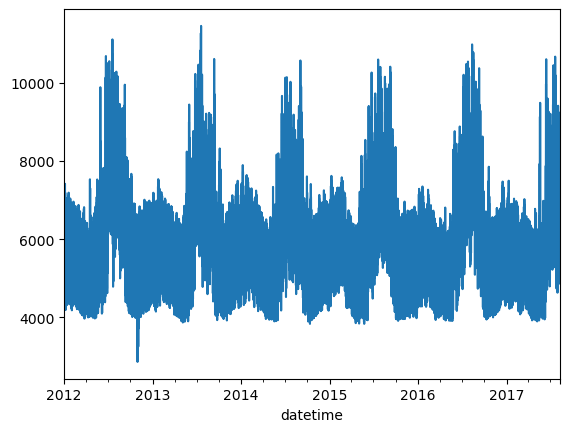

In [31]:
df.set_index('datetime').demand.plot()

In [32]:
import seaborn as sns

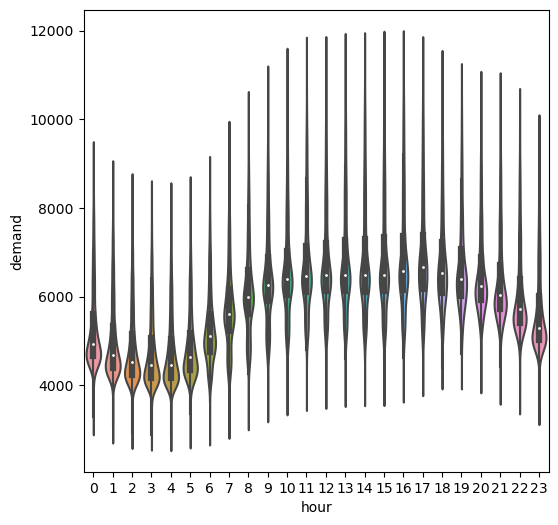

In [33]:
plt.figure(figsize=(6,6))
sns.violinplot(data=df, x='hour', y='demand')
plt.show()

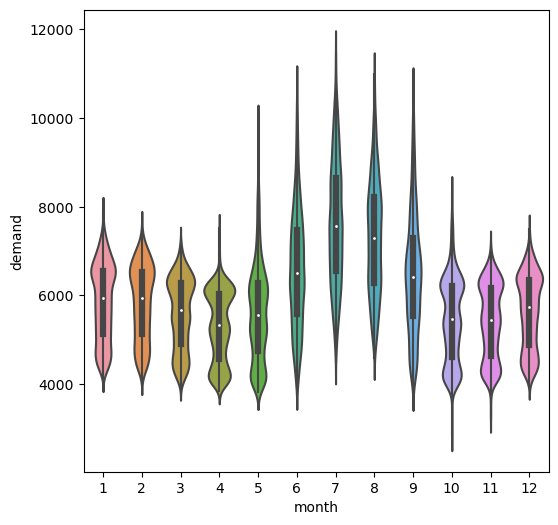

In [34]:
plt.figure(figsize=(6,6))
sns.violinplot(data=df, x='month', y='demand')
plt.show()

In [35]:
# for i in range(24):
#     pd.pivot_table(df[df.hour==i], index='month', columns='day', values='demand').plot(legend=False)
#     plt.show()


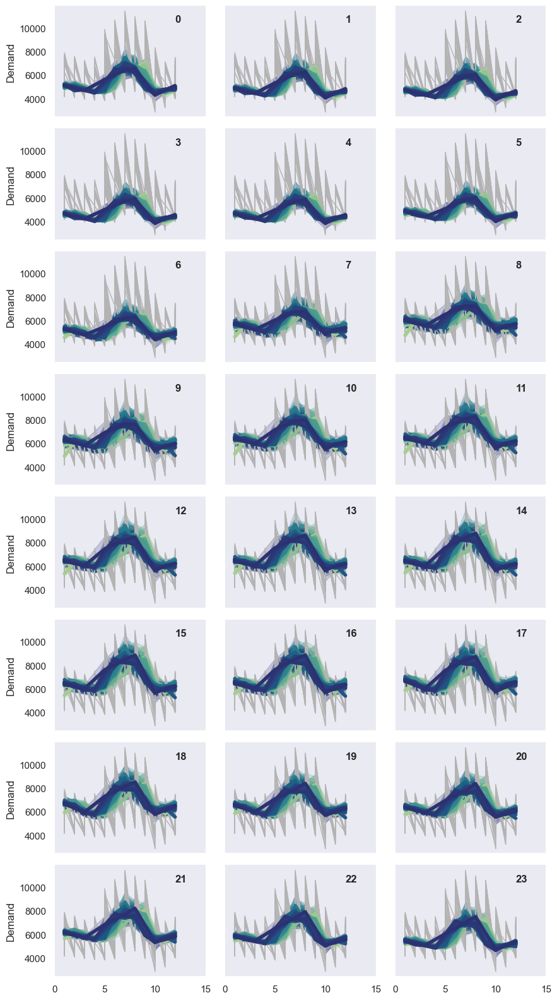

In [36]:
sns.set_theme(style="dark")

# Plot each day's time series in its own facet
g = sns.relplot(
    data=df,
    x="month", y="demand", col="hour", hue="day",
    kind="line", palette="crest", linewidth=4, zorder=5,
    col_wrap=3, height=2, aspect=1.5, legend=False,
)

# Iterate over each subplot to customize further
for year, ax in g.axes_dict.items():

    # Add the title as an annotation within the plot
    ax.text(.8, .85, year, transform=ax.transAxes, fontweight="bold")

    # Plot every year's time series in the background
    sns.lineplot(
        data=df, x="month", y="demand", units="day",
        estimator=None, color=".7", linewidth=1, ax=ax,
    )

# Reduce the frequency of the x axis ticks
ax.set_xticks(ax.get_xticks()[::2])

# Tweak the supporting aspects of the plot
g.set_titles("")
g.set_axis_labels("", "Demand")
g.tight_layout()

In [40]:
nrow, ncol = 3, 4
count = 1
ar_coord = {}
for r in range(nrow):
    for c in range(ncol):
        ar_coord[count] = (r,c)
        count+=1

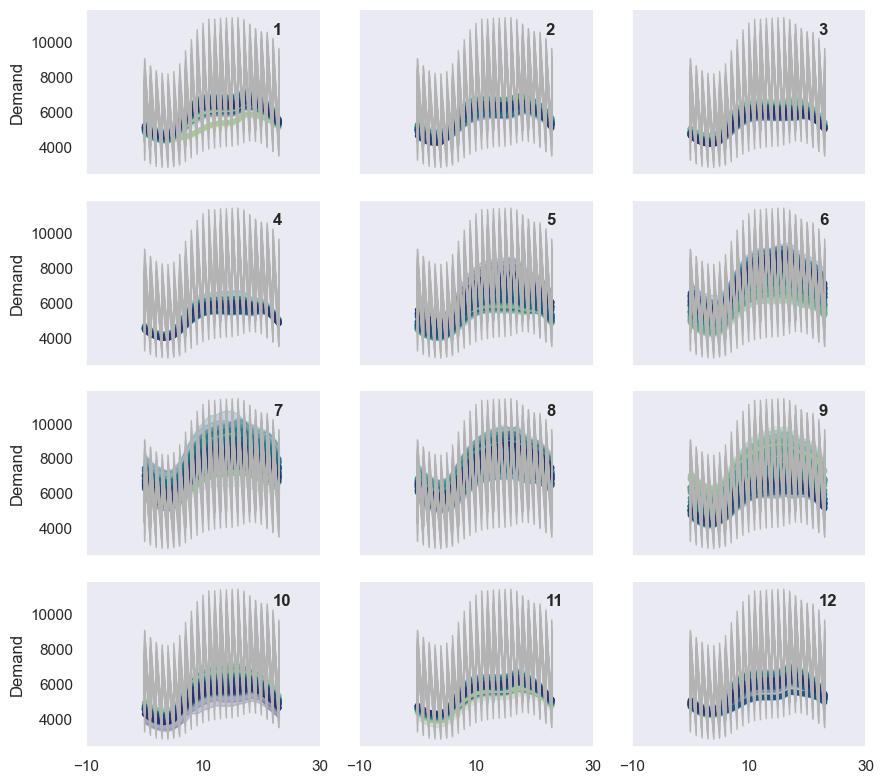

In [ ]:
sns.set_theme(style="dark")

g = sns.relplot(
    data=df,
    x="hour", y="demand", col="month", hue="day",
    kind="line", palette="crest", linewidth=4, 
    # zorder=5,
    col_wrap=3, 
    height=2, 
    aspect=1.5, 
    legend=False,
)

for fig, ax in g.axes_dict.items():

    ax.text(.8, .85, fig, transform=ax.transAxes, fontweight="bold")

    sns.lineplot(
        data=df, x="hour", y="demand", units="day",
        estimator=None, color=".7", linewidth=1, ax=ax,
    )

# Reduce the frequency of the x axis ticks
ax.set_xticks(ax.get_xticks()[::2])

# Tweak the supporting aspects of the plot
g.set_titles("")
g.set_axis_labels("", "Demand")
g.tight_layout()

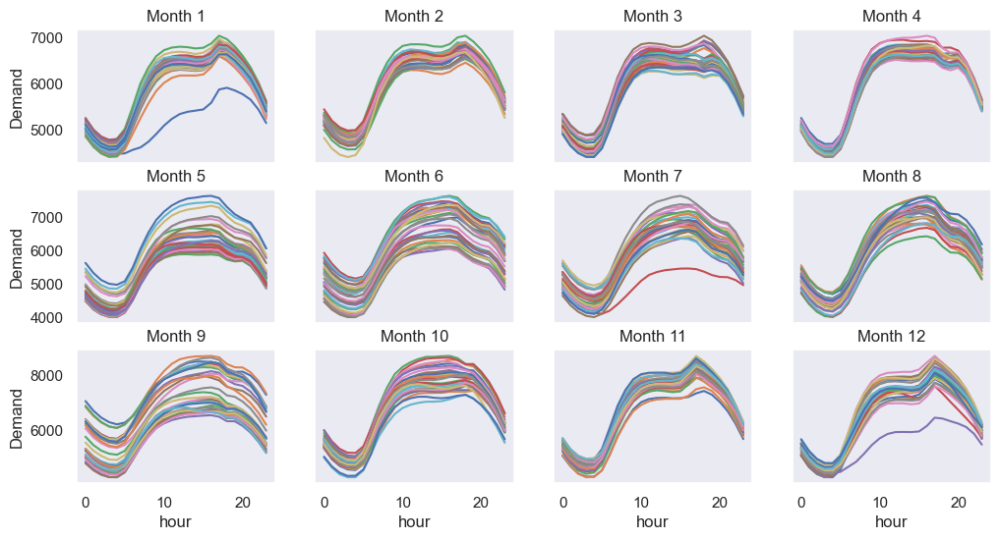

In [41]:
fig, axes = plt.subplots(nrow, ncol, figsize=(12, 6))
for i in range(1, 13):
    ax_coord = ar_coord[i]
    pd.pivot_table(df[df.month==i], index='hour', columns='day', values='demand').plot(title=f'Month {i}', legend=False, ax=axes[ax_coord[0],ax_coord[1]], sharex=True, sharey=True)
plt.setp(axes[:, 0], ylabel='Demand')
plt.show()

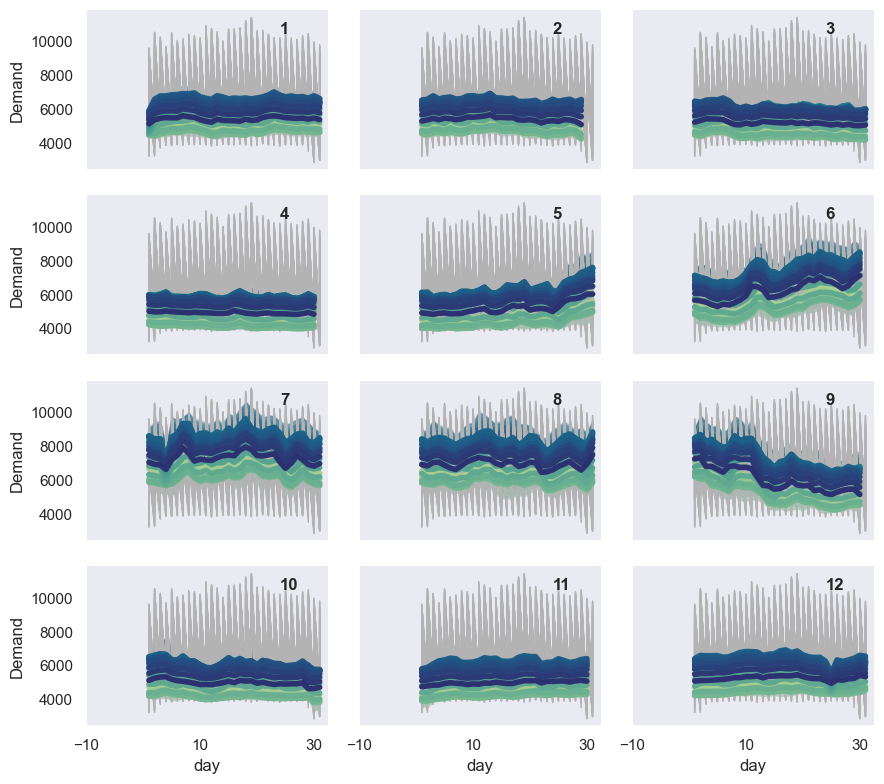

In [42]:
sns.set_theme(style="dark")

g = sns.relplot(
    data=df,
    x="day", y="demand", col="month", hue="hour",
    kind="line", palette="crest", linewidth=4, 
    zorder=5,
    col_wrap=3, 
    height=2, 
    aspect=1.5, 
    legend=False,
)

for fig, ax in g.axes_dict.items():

    ax.text(.8, .85, fig, transform=ax.transAxes, fontweight="bold")

    sns.lineplot(
        data=df, x="day", y="demand", units="hour",
        estimator=None, color=".7", linewidth=1, ax=ax,
    )

# Reduce the frequency of the x axis ticks
ax.set_xticks(ax.get_xticks()[::2])

# Tweak the supporting aspects of the plot
g.set_titles("")
g.set_axis_labels("day", "Demand")
g.tight_layout()

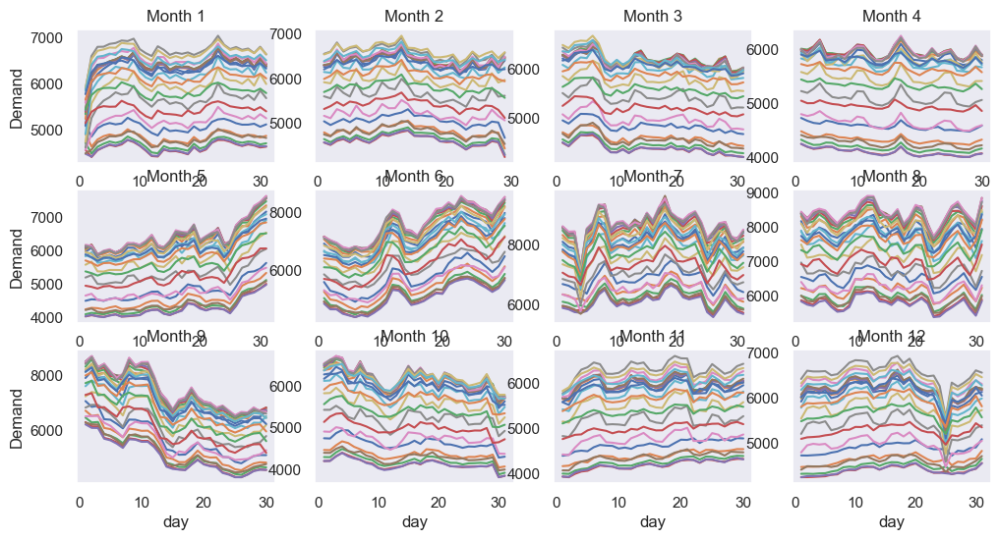

In [43]:
fig, axes = plt.subplots(nrow, ncol, figsize=(12, 6))
for i in range(1, 13):
    ax_coord = ar_coord[i]
    pd.pivot_table(df[df.month==i], index='day', columns='hour', values='demand').plot(title=f'Month {i}' ,legend=False, ax=axes[ax_coord[0],ax_coord[1]])
plt.setp(axes[:, 0], ylabel='Demand')
plt.show()

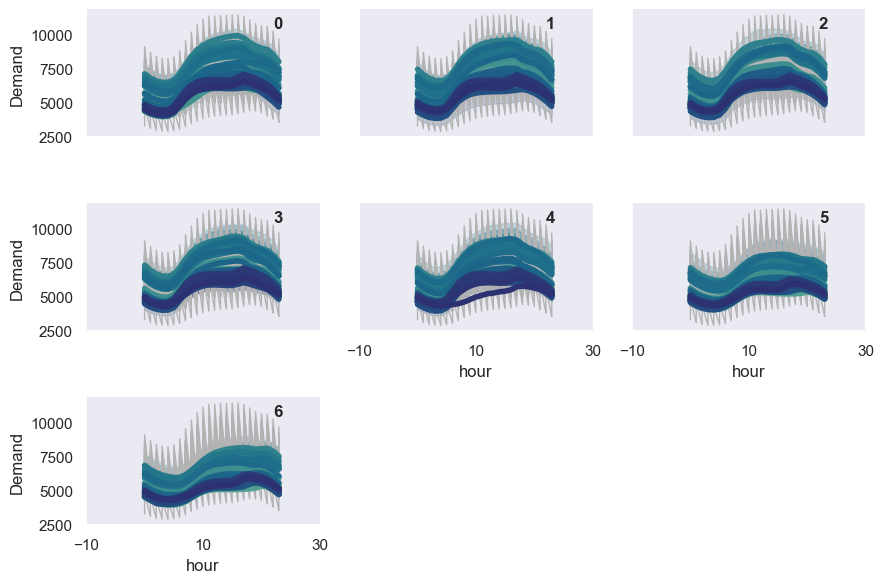

In [43]:
sns.set_theme(style="dark")

g = sns.relplot(
    data=df,
    x="hour", y="demand", col="day_of_week", hue="week",
    kind="line", palette="crest", linewidth=4, 
    zorder=5,
    col_wrap=3, 
    height=2, 
    aspect=1.5, 
    legend=False,
)

for fig, ax in g.axes_dict.items():

    ax.text(.8, .85, fig, transform=ax.transAxes, fontweight="bold")

    sns.lineplot(
        data=df, x="hour", y="demand", units="week",
        estimator=None, color=".7", linewidth=1, ax=ax,
    )

# Reduce the frequency of the x axis ticks
ax.set_xticks(ax.get_xticks()[::2])

# Tweak the supporting aspects of the plot
g.set_titles("")
g.set_axis_labels("hour", "Demand")
g.tight_layout()

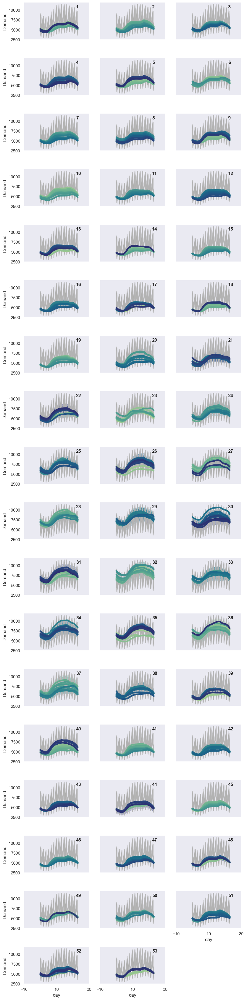

In [36]:
sns.set_theme(style="dark")

g = sns.relplot(
    data=df,
    x="hour", y="demand", col="week", hue="day",
    kind="line", palette="crest", linewidth=4, 
    zorder=5,
    col_wrap=3, 
    height=2, 
    aspect=1.5, 
    legend=False,
)

for fig, ax in g.axes_dict.items():

    ax.text(.8, .85, fig, transform=ax.transAxes, fontweight="bold")

    sns.lineplot(
        data=df, x="hour", y="demand", units="day",
        estimator=None, color=".7", linewidth=1, ax=ax,
    )

# Reduce the frequency of the x axis ticks
ax.set_xticks(ax.get_xticks()[::2])

# Tweak the supporting aspects of the plot
g.set_titles("")
g.set_axis_labels("hour", "Demand")
g.tight_layout()

In [1]:
from statsmodels.tsa.seasonal import seasonal_decompose

In [35]:
pd.infer_freq(df.set_index('datetime').index)

'H'

In [84]:
decomp = seasonal_decompose(df.set_index('datetime')['demand'], model='multiplicative')

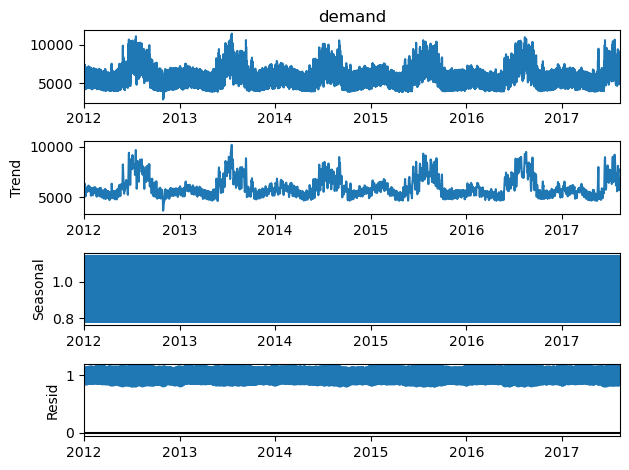

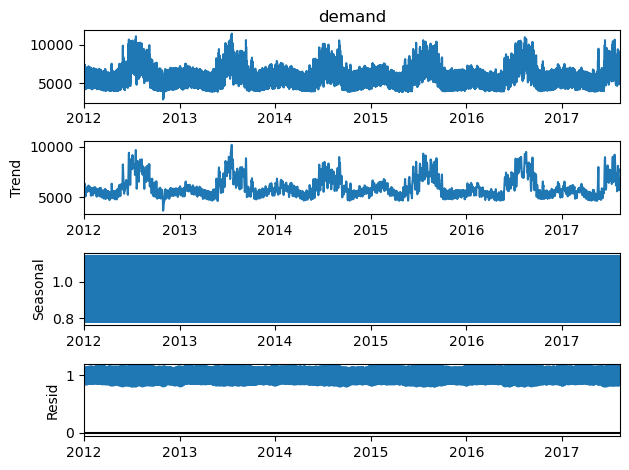

In [85]:
decomp.plot()

In [87]:
seasonal_df = pd.DataFrame(decomp.seasonal)

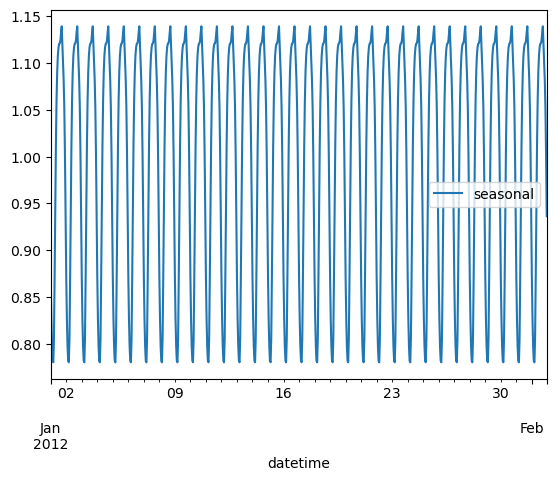

In [88]:
ax = seasonal_df.loc[:'2012-02-01', :].plot()


In [89]:
residual_df = pd.DataFrame(decomp.resid)

In [115]:
left_dt_bound = pd.date_range(start=df.datetime.min(), end=df.datetime.max(), freq=str(24*7)+'H')
right_dt_bound = left_dt_bound[1:]
left_dt_bound = left_dt_bound[:-1]

In [123]:
strafe = zip(left_dt_bound, right_dt_bound)

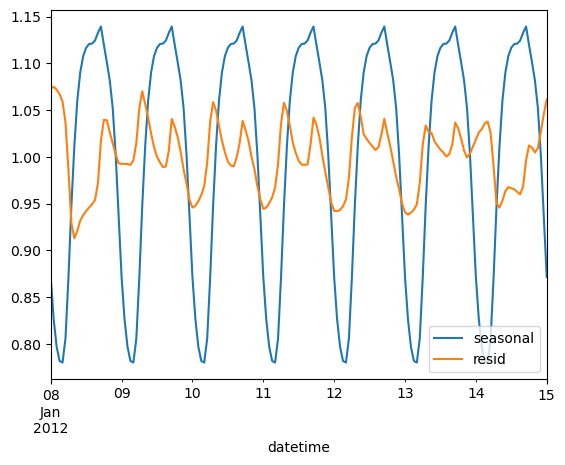

In [125]:
next_date = next(strafe)
ax = seasonal_df.loc[next_date[0]:next_date[1], :].plot(sharey=False)
residual_df.loc[next_date[0]:next_date[1], :].plot(ax=ax, sharey=False)
plt.show()

In [126]:
from statsmodels.tsa.stattools import adfuller

In [132]:
df.sort_values('datetime', inplace=True)

In [133]:
result = adfuller(df.set_index('datetime')['demand'])

In [136]:
print('ADF Statistic: %f' % result[0])
print('p-value: %s' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

ADF Statistic: -10.880378
p-value: 1.2993764161839394e-19
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


The time series is stationary as the p-value is less than 0.05 & ADF statistic value is also less than value at significance level of 1%.

In [137]:
from statsmodels.graphics.tsaplots import plot_pacf

c:\ProgramData\Miniconda3\envs\Azure\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


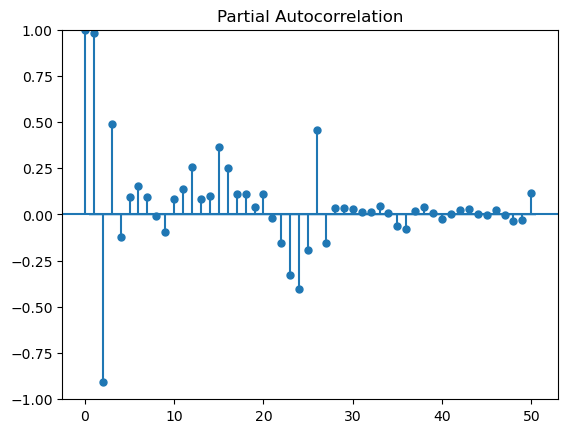

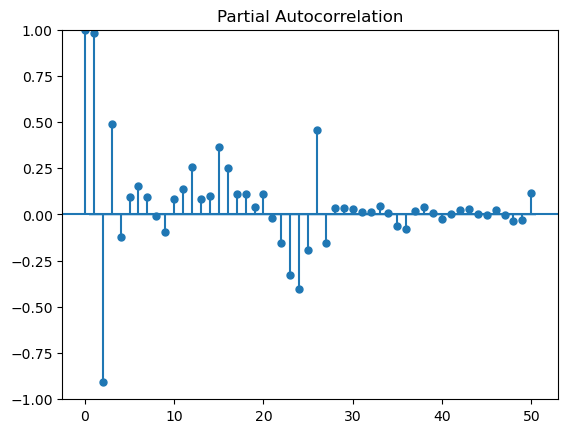

In [139]:
plot_pacf(df.set_index('datetime').demand, lags=50)

In [142]:
demand_autocorr = pd.DataFrame(zip(range(24,48), [df.set_index('datetime')['demand'].autocorr(i) for i in range(24,48)]),
                               columns=['lag', 'autocorr'])

In [143]:
demand_autocorr[demand_autocorr.autocorr>=0.5]

,lag,autocorr
0,24,0.898888
1,25,0.877939
2,26,0.825111
3,27,0.748124
4,28,0.655519
5,29,0.555458
20,44,0.577987
21,45,0.660706
22,46,0.728105
23,47,0.772364


In [144]:
df.sort_values('datetime', inplace=True)

In [145]:
from scipy.signal import correlate, correlation_lags

In [146]:
correlation = correlate(df.temperature, df.demand)

In [147]:
lags = correlation_lags(df.temperature.size, df.demand.size)

In [149]:
lag = lags[np.argmax(correlation)]

In [150]:
lag

-6

In [151]:
def create_lag_features(df, col, lag):
    df[col+'_lag'+str(lag)] = df[col].shift(lag)

In [152]:
weather_features = ['temperature', 'precipTime', 'precipDepth', 'snowDepth', 'precipDepth/precipTime']

In [153]:
for col in weather_features:
    create_lag_features(df, col, 24)

In [154]:
def get_lagged_features(df):
    return [col for col in df.columns if '_lag' in col]

In [155]:
for lag in range(24, 29):
    create_lag_features(df, 'demand', lag)

In [156]:
df.dropna(inplace=True)

In [157]:
predictors = get_lagged_features(df)

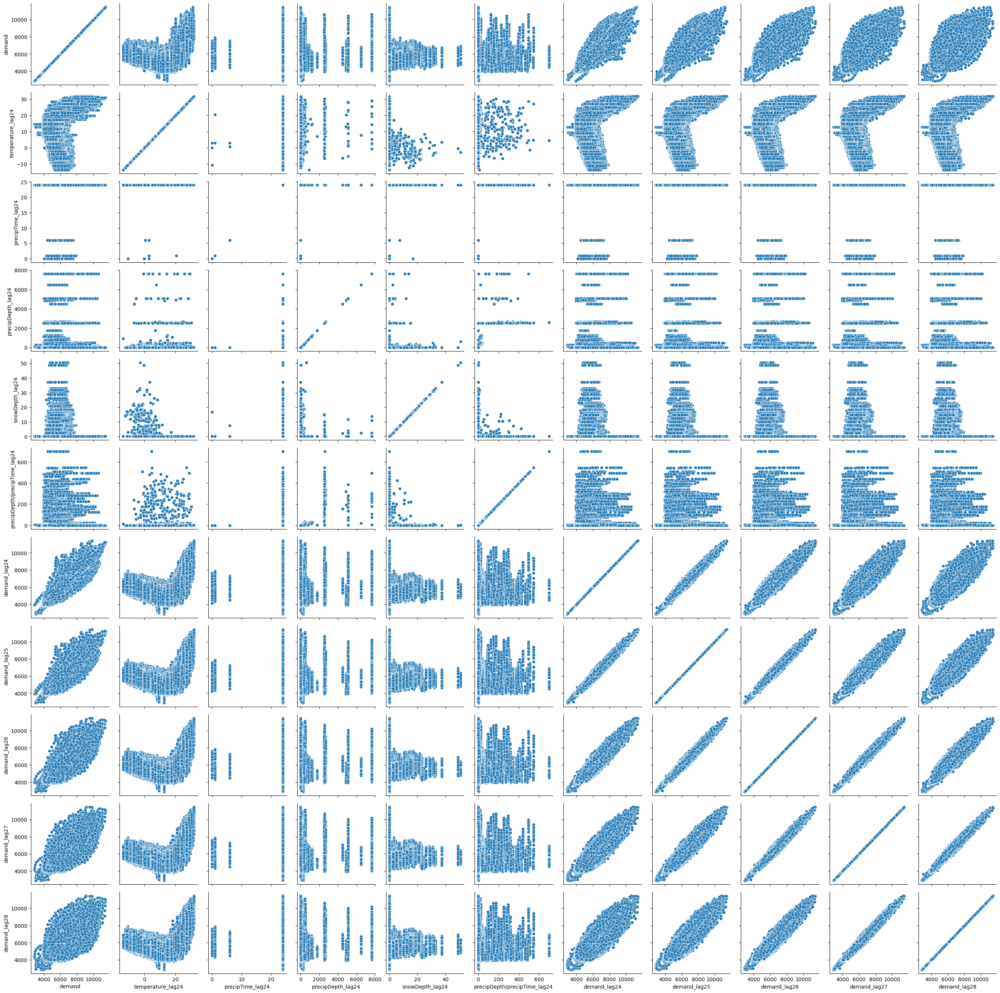

In [159]:
g = sns.PairGrid(df[['demand']+predictors])
g.map(sns.scatterplot)

C:\Users\Satya\AppData\Local\Temp\ipykernel_24224\58359773.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr())


<AxesSubplot: >

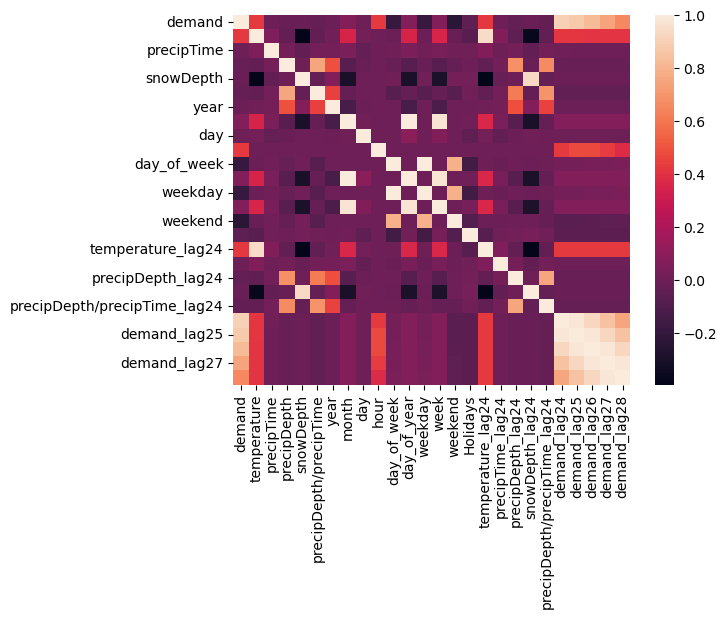

In [160]:
sns.heatmap(df.corr())

In [161]:
from sklearn.feature_selection import mutual_info_regression

In [162]:
def make_mi_scores(X, y, discrete_features):
    mi_scores = mutual_info_regression(X, y, discrete_features=discrete_features)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
    mi_scores = mi_scores.sort_values()
    return mi_scores

In [171]:
discrete_features = df.drop(['demand', 'datetime', 'new_datetime', 'timeStamp', 'date', 'time']+weather_features, axis=1).dtypes == int

In [172]:
mi_score = make_mi_scores(df.drop(['demand', 'datetime', 'new_datetime', 'timeStamp', 'date', 'time']+weather_features, axis=1), df['demand'], discrete_features)

<AxesSubplot: >

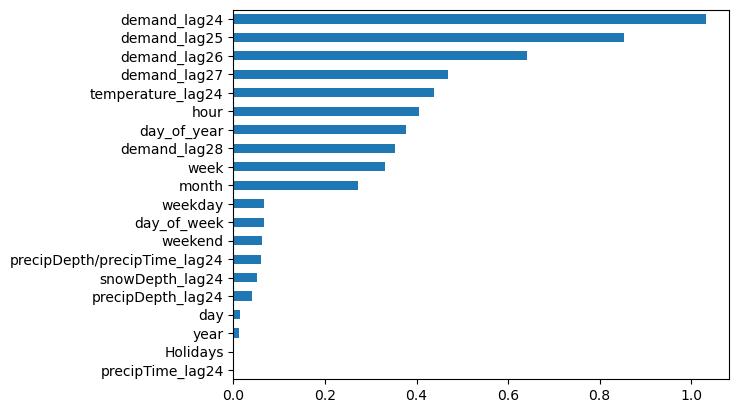

In [173]:
mi_score.plot.barh()

In [174]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [180]:
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Scatter(x=df['datetime'], y=df['demand'], name="demand"),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=df['datetime'], y=df['temperature_lag24'], name="temperature_lag24"),
    secondary_y=True,
)

In [184]:
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Scatter(x=df['datetime'], y=np.log(df['demand']), name="demand"),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=df['datetime'], y=df['precipDepth_lag24'], name="precipDepth_lag24"),
    secondary_y=True,
)

In [192]:
data = df.drop(['new_datetime', 'timeStamp', 'date', 'time']+weather_features, axis=1).set_index('datetime')

In [269]:
x = list(range(len(data.index)))
y = data.demand

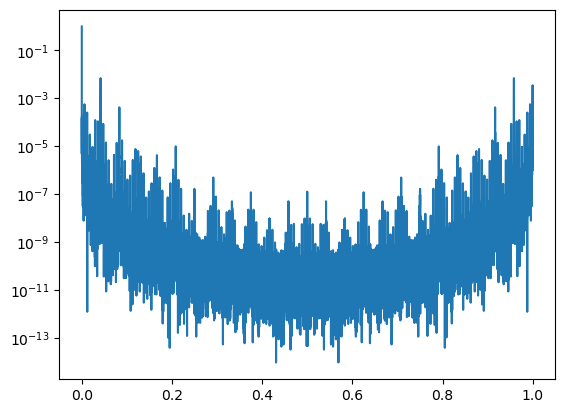

In [270]:
f=abs(np.fft.fft(y))

# get the list of frequencies
num=np.size(x)
freq = [i / num for i in list(range(num))]

# get the list of spectrums
spectrum=f.real*f.real+f.imag*f.imag
nspectrum=spectrum/spectrum[0]

# plot nspectrum per frequency, with a semilog scale on nspectrum
plt.semilogy(freq,nspectrum)

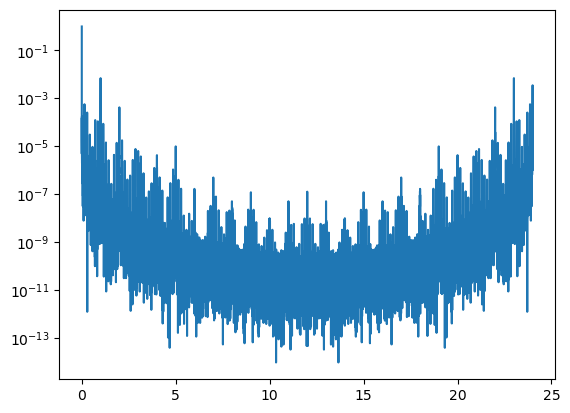

In [280]:
results = pd.DataFrame({'freq': freq, 'nspectrum': nspectrum})
results['period'] = results['freq'] / (1/24)
plt.semilogy(results['period'], results['nspectrum'])

In [194]:
from sklearn.preprocessing import StandardScaler

In [ ]:
from skforecast.ForecasterAutoregDirect import ForecasterAutoregDirect

In [ ]:
from sklearn.linear_model import Lasso, Ridge

In [198]:
from skforecast.model_selection import grid_search_forecaster
from skforecast.model_selection import backtesting_forecaster

c:\ProgramData\Miniconda3\envs\Azure\lib\site-packages\tqdm\auto.py:22: TqdmWarning:

IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html



In [212]:
val_split_point = data.index[-24*365]

In [217]:
test_split_point = data.index[-24*7]

In [218]:
end_train = val_split_point
end_validation = test_split_point
data_train = data.loc[: end_train, :]
data_val   = data.loc[end_train:end_validation, :]
data_test  = data.loc[end_validation:, :]

In [220]:
exog_columns = datetime_features+predictors

In [ ]:
exog_cols = datetime_features+predictors

In [235]:
from sklearn.metrics import mean_absolute_percentage_error, mean_absolute_error

In [244]:
def get_mape(y_true, y_pred):
    return mean_absolute_percentage_error(y_true, y_pred)*100

In [229]:
data.index.freq = 'H'

In [230]:
data.index.freq

<Hour>

In [292]:
def run_grid_search(reg, param_grid, exog_data=None, scaler=None, steps=24, **kwargs):
    forecaster = ForecasterAutoregDirect(
                regressor     = reg,
                transformer_y = scaler,
                steps         = 24,
                lags          = [24, 25, 26, 27, 28]
             )
    lags_grid = [[24, 25, 26, 27, 28], [24, 25, 26, 27, 28, 44, 45, 46, 47]]
    
    grid_search_args = {'refit': False,
                        'fixed_train_size' : False,
                        'return_best' : True,
                        'verbose' : False
                        }

    if kwargs:
        grid_search_args.update(kwargs)
    results_grid = grid_search_forecaster(
                    forecaster         = forecaster,
                    y                  = data.loc[:end_validation, 'demand'],
                    exog               = exog_data,
                    param_grid         = param_grid,
                    lags_grid          = lags_grid,
                    steps              = 24,
                    metric             = get_mape,
                    initial_train_size = len(data.loc[:end_train]),
                    **grid_search_args
                )
    return results_grid

In [234]:
exog1_cols = list(set(exog_columns) - {'demand_lag24', 'demand_lag25', 'demand_lag26', 'demand_lag27', 'demand_lag28'})

In [294]:
run_grid_search(Lasso(random_state=123), {'alpha': np.linspace(0, 0.2, 21)},
                data.loc[:end_validation, exog1_cols], StandardScaler()
)

Number of models compared: 42.


loop lags_grid:   0%|                                               | 0/2 [00:00<?, ?it/s]c:\ProgramData\Miniconda3\envs\Azure\lib\site-packages\skforecast\ForecasterAutoregDirect\ForecasterAutoregDirect.py:592: UserWarning:

With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator

c:\ProgramData\Miniconda3\envs\Azure\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:648: UserWarning:

Coordinate descent with no regularization may lead to unexpected results and is discouraged.

c:\ProgramData\Miniconda3\envs\Azure\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:648: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.778e+03, tolerance: 4.028e+00 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implem

`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [24 25 26 27 28 44 45 46 47] 
  Parameters: {'alpha': 0.16}
  Backtesting metric: 9.738539966872928



,lags,params,get_mape,alpha
37,"[24, 25, 26, 27, 28, 44, 45, 46, 47]",{'alpha': 0.16},9.738540,0.16
36,"[24, 25, 26, 27, 28, 44, 45, 46, 47]",{'alpha': 0.15},9.743023,0.15
38,"[24, 25, 26, 27, 28, 44, 45, 46, 47]",{'alpha': 0.17},9.747589,0.17
35,"[24, 25, 26, 27, 28, 44, 45, 46, 47]",{'alpha': 0.14},9.760799,0.14
39,"[24, 25, 26, 27, 28, 44, 45, 46, 47]",{'alpha': 0.18},9.775205,0.18
34,"[24, 25, 26, 27, 28, 44, 45, 46, 47]",{'alpha': 0.13},9.794664,0.13
40,"[24, 25, 26, 27, 28, 44, 45, 46, 47]",{'alpha': 0.19},9.818240,0.19
33,"[24, 25, 26, 27, 28, 44, 45, 46, 47]",{'alpha': 0.12},9.844659,0.12
11,"[24, 25, 26, 27, 28]",{'alpha': 0.11},9.864095,0.11
10,"[24, 25, 26, 27, 28]",{'alpha': 0.1},9.872327,0.10


In [295]:
exog2_cols = list(set(exog1_cols)-set(predictors))

In [296]:
results = run_grid_search(Lasso(random_state=123), {'alpha': np.linspace(0, 0.2, 21)},
                          data.loc[:end_validation, exog2_cols], StandardScaler()
                            )

Number of models compared: 42.


loop lags_grid:   0%|                                               | 0/2 [00:00<?, ?it/s]c:\ProgramData\Miniconda3\envs\Azure\lib\site-packages\skforecast\ForecasterAutoregDirect\ForecasterAutoregDirect.py:592: UserWarning:

With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator

c:\ProgramData\Miniconda3\envs\Azure\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:648: UserWarning:

Coordinate descent with no regularization may lead to unexpected results and is discouraged.

c:\ProgramData\Miniconda3\envs\Azure\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:648: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.890e+03, tolerance: 4.028e+00 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implem

`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [24 25 26 27 28 44 45 46 47] 
  Parameters: {'alpha': 0.0}
  Backtesting metric: 7.7208370955643595



c:\ProgramData\Miniconda3\envs\Azure\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:648: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.195e+03, tolerance: 4.892e+00 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.



In [297]:
results = run_grid_search(Lasso(random_state=123), {'alpha': np.linspace(0, 0.2, 21)},
                          pd.get_dummies(data.loc[:end_validation, exog2_cols], columns=['month', 'day_of_week']), 
                          StandardScaler()
                            )

Number of models compared: 42.


loop lags_grid:   0%|                                               | 0/2 [00:00<?, ?it/s]c:\ProgramData\Miniconda3\envs\Azure\lib\site-packages\skforecast\ForecasterAutoregDirect\ForecasterAutoregDirect.py:592: UserWarning:

With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator

c:\ProgramData\Miniconda3\envs\Azure\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:648: UserWarning:

Coordinate descent with no regularization may lead to unexpected results and is discouraged.

c:\ProgramData\Miniconda3\envs\Azure\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:648: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.320e+03, tolerance: 4.028e+00 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implem

`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [24 25 26 27 28 44 45 46 47] 
  Parameters: {'alpha': 0.0}
  Backtesting metric: 7.207872660204188



c:\ProgramData\Miniconda3\envs\Azure\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:648: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.260e+03, tolerance: 4.892e+00 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.



In [258]:
run_grid_search(Ridge(random_state=123), {'alpha':np.linspace(0, 0.2, 21)}, 
                data.loc[:end_validation, exog1_cols], 
                StandardScaler()
                )

Number of models compared: 42.


loop lags_grid:   0%|                                               | 0/2 [00:00<?, ?it/s]c:\ProgramData\Miniconda3\envs\Azure\lib\site-packages\sklearn\linear_model\_ridge.py:212: LinAlgWarning:

Ill-conditioned matrix (rcond=7.00263e-21): result may not be accurate.

c:\ProgramData\Miniconda3\envs\Azure\lib\site-packages\sklearn\linear_model\_ridge.py:212: LinAlgWarning:

Ill-conditioned matrix (rcond=1.40048e-20): result may not be accurate.

c:\ProgramData\Miniconda3\envs\Azure\lib\site-packages\sklearn\linear_model\_ridge.py:212: LinAlgWarning:

Ill-conditioned matrix (rcond=1.40033e-20): result may not be accurate.

c:\ProgramData\Miniconda3\envs\Azure\lib\site-packages\sklearn\linear_model\_ridge.py:212: LinAlgWarning:

Ill-conditioned matrix (rcond=2.80057e-20): result may not be accurate.

c:\ProgramData\Miniconda3\envs\Azure\lib\site-packages\sklearn\linear_model\_ridge.py:212: LinAlgWarning:

Ill-conditioned matrix (rcond=1.40024e-20): result may not be accurate.

c:\Program

`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [24 25 26 27 28] 
  Parameters: {'alpha': 0.2}
  Backtesting metric: 20.224068130938875



,lags,params,get_mape,alpha
20,"[24, 25, 26, 27, 28]",{'alpha': 0.2},20.224068,0.20
19,"[24, 25, 26, 27, 28]",{'alpha': 0.19},20.224118,0.19
18,"[24, 25, 26, 27, 28]",{'alpha': 0.18},20.224167,0.18
17,"[24, 25, 26, 27, 28]",{'alpha': 0.17},20.224217,0.17
16,"[24, 25, 26, 27, 28]",{'alpha': 0.16},20.224267,0.16
15,"[24, 25, 26, 27, 28]",{'alpha': 0.15},20.224318,0.15
14,"[24, 25, 26, 27, 28]",{'alpha': 0.14},20.224369,0.14
13,"[24, 25, 26, 27, 28]",{'alpha': 0.13},20.224420,0.13
12,"[24, 25, 26, 27, 28]",{'alpha': 0.12},20.224472,0.12
11,"[24, 25, 26, 27, 28]",{'alpha': 0.11},20.224524,0.11


In [259]:
run_grid_search(Ridge(random_state=123), {'alpha':np.linspace(0, 0.2, 21)}, 
                data.loc[:end_validation, exog2_cols], 
                StandardScaler()
                )

Number of models compared: 42.


loop lags_grid:   0%|                                               | 0/2 [00:00<?, ?it/s]c:\ProgramData\Miniconda3\envs\Azure\lib\site-packages\sklearn\linear_model\_ridge.py:212: LinAlgWarning:

Ill-conditioned matrix (rcond=2.83578e-20): result may not be accurate.

c:\ProgramData\Miniconda3\envs\Azure\lib\site-packages\sklearn\linear_model\_ridge.py:212: LinAlgWarning:

Ill-conditioned matrix (rcond=1.13471e-19): result may not be accurate.

c:\ProgramData\Miniconda3\envs\Azure\lib\site-packages\sklearn\linear_model\_ridge.py:212: LinAlgWarning:

Ill-conditioned matrix (rcond=4.82459e-19): result may not be accurate.

c:\ProgramData\Miniconda3\envs\Azure\lib\site-packages\sklearn\linear_model\_ridge.py:212: LinAlgWarning:

Ill-conditioned matrix (rcond=8.51552e-20): result may not be accurate.

loop lags_grid:  50%|███████████████████▌                   | 1/2 [01:16<01:16, 76.42s/it]c:\ProgramData\Miniconda3\envs\Azure\lib\site-packages\sklearn\linear_model\_ridge.py:212: LinAlgWar

`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [24 25 26 27 28 44 45 46 47] 
  Parameters: {'alpha': 0.2}
  Backtesting metric: 7.712389505483257



,lags,params,get_mape,alpha
41,"[24, 25, 26, 27, 28, 44, 45, 46, 47]",{'alpha': 0.2},7.712390,0.20
40,"[24, 25, 26, 27, 28, 44, 45, 46, 47]",{'alpha': 0.19},7.712391,0.19
39,"[24, 25, 26, 27, 28, 44, 45, 46, 47]",{'alpha': 0.18},7.712393,0.18
38,"[24, 25, 26, 27, 28, 44, 45, 46, 47]",{'alpha': 0.17},7.712395,0.17
37,"[24, 25, 26, 27, 28, 44, 45, 46, 47]",{'alpha': 0.16},7.712397,0.16
36,"[24, 25, 26, 27, 28, 44, 45, 46, 47]",{'alpha': 0.15},7.712400,0.15
35,"[24, 25, 26, 27, 28, 44, 45, 46, 47]",{'alpha': 0.14},7.712403,0.14
34,"[24, 25, 26, 27, 28, 44, 45, 46, 47]",{'alpha': 0.13},7.712406,0.13
33,"[24, 25, 26, 27, 28, 44, 45, 46, 47]",{'alpha': 0.12},7.712410,0.12
32,"[24, 25, 26, 27, 28, 44, 45, 46, 47]",{'alpha': 0.11},7.712413,0.11


In [260]:
run_grid_search(Ridge(random_state=123), {'alpha':np.linspace(0, 0.2, 21)}, 
                pd.get_dummies(data.loc[:end_validation, exog2_cols], columns=['month', 'day_of_week']), 
                StandardScaler()
                )

Number of models compared: 42.


loop lags_grid:  50%|███████████████████                   | 1/2 [02:12<02:12, 132.13s/it]c:\ProgramData\Miniconda3\envs\Azure\lib\site-packages\sklearn\linear_model\_ridge.py:212: LinAlgWarning:

Ill-conditioned matrix (rcond=1.46548e-21): result may not be accurate.

c:\ProgramData\Miniconda3\envs\Azure\lib\site-packages\sklearn\linear_model\_ridge.py:212: LinAlgWarning:

Ill-conditioned matrix (rcond=2.37243e-21): result may not be accurate.

loop lags_grid: 100%|██████████████████████████████████████| 2/2 [04:24<00:00, 132.04s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [24 25 26 27 28 44 45 46 47] 
  Parameters: {'alpha': 0.0}
  Backtesting metric: 7.179324592152961



,lags,params,get_mape,alpha
21,"[24, 25, 26, 27, 28, 44, 45, 46, 47]",{'alpha': 0.0},7.179325,0.00
22,"[24, 25, 26, 27, 28, 44, 45, 46, 47]",{'alpha': 0.01},7.180669,0.01
23,"[24, 25, 26, 27, 28, 44, 45, 46, 47]",{'alpha': 0.02},7.182200,0.02
24,"[24, 25, 26, 27, 28, 44, 45, 46, 47]",{'alpha': 0.03},7.183413,0.03
25,"[24, 25, 26, 27, 28, 44, 45, 46, 47]",{'alpha': 0.04},7.184404,0.04
26,"[24, 25, 26, 27, 28, 44, 45, 46, 47]",{'alpha': 0.05},7.185234,0.05
27,"[24, 25, 26, 27, 28, 44, 45, 46, 47]",{'alpha': 0.06},7.185939,0.06
28,"[24, 25, 26, 27, 28, 44, 45, 46, 47]",{'alpha': 0.07},7.186541,0.07
29,"[24, 25, 26, 27, 28, 44, 45, 46, 47]",{'alpha': 0.08},7.187069,0.08
30,"[24, 25, 26, 27, 28, 44, 45, 46, 47]",{'alpha': 0.09},7.187532,0.09


In [277]:
from lightgbm import LGBMRegressor

In [279]:
run_grid_search(LGBMRegressor(random_state=123),  
                param_grid = {'n_estimators': [100, 500],
                              'max_depth': [3, 5, 10],
                              'learning_rate': [0.01, 0.1]
                              },
                exog_data=data.loc[:end_validation, exog_cols]
                refit=True
                )

Number of models compared: 24.


loop lags_grid: 100%|██████████████████████████████████████| 2/2 [13:16<00:00, 398.28s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [24 25 26 27 28 44 45 46 47] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 10, 'n_estimators': 500}
  Backtesting metric: 3.9523325455652465



,lags,params,get_mape,learning_rate,max_depth,n_estimators
23,"[24, 25, 26, 27, 28, 44, 45, 46, 47]","{'learning_rate': 0.1, 'max_depth': 10, 'n_est...",3.952333,0.10,10.0,500.0
11,"[24, 25, 26, 27, 28]","{'learning_rate': 0.1, 'max_depth': 10, 'n_est...",3.968981,0.10,10.0,500.0
9,"[24, 25, 26, 27, 28]","{'learning_rate': 0.1, 'max_depth': 5, 'n_esti...",3.991536,0.10,5.0,500.0
8,"[24, 25, 26, 27, 28]","{'learning_rate': 0.1, 'max_depth': 5, 'n_esti...",4.043459,0.10,5.0,100.0
10,"[24, 25, 26, 27, 28]","{'learning_rate': 0.1, 'max_depth': 10, 'n_est...",4.044726,0.10,10.0,100.0
21,"[24, 25, 26, 27, 28, 44, 45, 46, 47]","{'learning_rate': 0.1, 'max_depth': 5, 'n_esti...",4.044742,0.10,5.0,500.0
22,"[24, 25, 26, 27, 28, 44, 45, 46, 47]","{'learning_rate': 0.1, 'max_depth': 10, 'n_est...",4.063183,0.10,10.0,100.0
20,"[24, 25, 26, 27, 28, 44, 45, 46, 47]","{'learning_rate': 0.1, 'max_depth': 5, 'n_esti...",4.071264,0.10,5.0,100.0
17,"[24, 25, 26, 27, 28, 44, 45, 46, 47]","{'learning_rate': 0.01, 'max_depth': 10, 'n_es...",4.104531,0.01,10.0,500.0
7,"[24, 25, 26, 27, 28]","{'learning_rate': 0.1, 'max_depth': 3, 'n_esti...",4.123198,0.10,3.0,500.0


In [290]:
run_grid_search(LGBMRegressor(random_state=123),  
                param_grid = {'n_estimators': [100, 500],
                              'max_depth': [3, 5, 10],
                              'learning_rate': [0.01, 0.1]
                              },
                exog_data=data.loc[:end_validation, ['month', 'day_of_week']].join(pd.get_dummies(data.loc[:end_validation, exog_cols], columns=['month', 'day_of_week']))
                )

Number of models compared: 24.


loop lags_grid: 100%|██████████████████████████████████████| 2/2 [18:18<00:00, 549.15s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [24 25 26 27 28] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 500}
  Backtesting metric: 3.9617667882939704



,lags,params,get_mape,learning_rate,max_depth,n_estimators
9,"[24, 25, 26, 27, 28]","{'learning_rate': 0.1, 'max_depth': 5, 'n_esti...",3.961767,0.10,5.0,500.0
11,"[24, 25, 26, 27, 28]","{'learning_rate': 0.1, 'max_depth': 10, 'n_est...",4.008628,0.10,10.0,500.0
8,"[24, 25, 26, 27, 28]","{'learning_rate': 0.1, 'max_depth': 5, 'n_esti...",4.015816,0.10,5.0,100.0
23,"[24, 25, 26, 27, 28, 44, 45, 46, 47]","{'learning_rate': 0.1, 'max_depth': 10, 'n_est...",4.023259,0.10,10.0,500.0
21,"[24, 25, 26, 27, 28, 44, 45, 46, 47]","{'learning_rate': 0.1, 'max_depth': 5, 'n_esti...",4.030724,0.10,5.0,500.0
15,"[24, 25, 26, 27, 28, 44, 45, 46, 47]","{'learning_rate': 0.01, 'max_depth': 5, 'n_est...",4.069778,0.01,5.0,500.0
20,"[24, 25, 26, 27, 28, 44, 45, 46, 47]","{'learning_rate': 0.1, 'max_depth': 5, 'n_esti...",4.072149,0.10,5.0,100.0
17,"[24, 25, 26, 27, 28, 44, 45, 46, 47]","{'learning_rate': 0.01, 'max_depth': 10, 'n_es...",4.077371,0.01,10.0,500.0
19,"[24, 25, 26, 27, 28, 44, 45, 46, 47]","{'learning_rate': 0.1, 'max_depth': 3, 'n_esti...",4.079484,0.10,3.0,500.0
3,"[24, 25, 26, 27, 28]","{'learning_rate': 0.01, 'max_depth': 5, 'n_est...",4.083020,0.01,5.0,500.0


In [263]:
from sklearn.ensemble import RandomForestRegressor

In [268]:
run_grid_search(RandomForestRegressor(random_state=123),  param_grid = {'n_estimators': [100, 500], 'max_depth': [3, 5, 10]},
                exog_data=data.loc[:end_validation, exog_cols]
                )

Number of models compared: 12.


loop lags_grid:   0%|                                               | 0/2 [09:24<?, ?it/s]


KeyboardInterrupt: 